In [1]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)
%cd /content/drive/My Drive/Proj2B

Mounted at /content/drive
/content/drive/My Drive/Proj2B


# Setting Up

In [2]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 691.5/691.5 kB 8.4 MB/s eta 0:00:00


In [3]:
!pip install fiftyone
!pip install fiftyone-db-ubuntu2204

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 29.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.3/42.3 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.3/139.3 kB 21.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.4/53.4 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.9/59.9 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 9.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.9/108.9 kB 15.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.6/70.6 kB 11.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 677.1/677.1 kB 57.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.3/70.3 kB 11.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 192.5/192.5 kB 22.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.5/88.5 kB 5.6 MB/s eta 0:00:00
  Preparing metadata (setup

In [4]:
import zipfile
import requests
import cv2
import matplotlib.pyplot as plt
import glob
import random
import os
from ultralytics import YOLO
import fiftyone as fo
import fiftyone.zoo as foz

Migrating database to v0.23.2


INFO:fiftyone.migrations.runner:Migrating database to v0.23.2


# Dataset Preparation

In [12]:
# Change where zoo datasets are downloaded
fo.config.dataset_zoo_dir = "/content/drive/My Drive/Proj2B/datasets"

# Load the COCO-2017 dataset
# This will download it from the FiftyOne Dataset Zoo if necessary
dataset = foz.load_zoo_dataset("coco-2017", split="train", label_types=["detections"], classes=["person"], max_samples=3000)
dataset_test = foz.load_zoo_dataset("coco-2017", split="validation", label_types=["detections"], classes=["person"], max_samples=500)

# Print summary information about the view
print(dataset)

INFO:fiftyone.zoo.datasets:Downloading split 'train' to '/content/drive/My Drive/Proj2B/datasets/coco-2017/train' if necessary


Found annotations at '/content/drive/My Drive/Proj2B/datasets/coco-2017/raw/instances_train2017.json'


INFO:fiftyone.utils.coco:Found annotations at '/content/drive/My Drive/Proj2B/datasets/coco-2017/raw/instances_train2017.json'


Sufficient images already downloaded


INFO:fiftyone.utils.coco:Sufficient images already downloaded


Existing download of split 'train' is sufficient


INFO:fiftyone.zoo.datasets:Existing download of split 'train' is sufficient


Loading 'coco-2017' split 'train'


INFO:fiftyone.zoo.datasets:Loading 'coco-2017' split 'train'


 100% |███████████████| 3000/3000 [28.8s elapsed, 0s remaining, 162.0 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 3000/3000 [28.8s elapsed, 0s remaining, 162.0 samples/s]      


Dataset 'coco-2017-train-3000' created


INFO:fiftyone.zoo.datasets:Dataset 'coco-2017-train-3000' created


INFO:fiftyone.zoo.datasets:Downloading split 'validation' to '/content/drive/My Drive/Proj2B/datasets/coco-2017/validation' if necessary


Found annotations at '/content/drive/My Drive/Proj2B/datasets/coco-2017/raw/instances_val2017.json'


INFO:fiftyone.utils.coco:Found annotations at '/content/drive/My Drive/Proj2B/datasets/coco-2017/raw/instances_val2017.json'


Sufficient images already downloaded


INFO:fiftyone.utils.coco:Sufficient images already downloaded


Existing download of split 'validation' is sufficient


INFO:fiftyone.zoo.datasets:Existing download of split 'validation' is sufficient


Loading 'coco-2017' split 'validation'


INFO:fiftyone.zoo.datasets:Loading 'coco-2017' split 'validation'


 100% |█████████████████| 500/500 [5.1s elapsed, 0s remaining, 107.4 samples/s]     


INFO:eta.core.utils: 100% |█████████████████| 500/500 [5.1s elapsed, 0s remaining, 107.4 samples/s]     


Dataset 'coco-2017-validation-500' created


INFO:fiftyone.zoo.datasets:Dataset 'coco-2017-validation-500' created


Name:        coco-2017-train-3000
Media type:  image
Num samples: 3000
Persistent:  False
Tags:        []
Sample fields:
    id:           fiftyone.core.fields.ObjectIdField
    filepath:     fiftyone.core.fields.StringField
    tags:         fiftyone.core.fields.ListField(fiftyone.core.fields.StringField)
    metadata:     fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.metadata.ImageMetadata)
    ground_truth: fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)


In [13]:
# Adjust the file directories to replicate the directory style usage of YOLO

os.makedirs('datasets/coco-2017/images/train', exist_ok=True)
os.makedirs('datasets/coco-2017/images/val', exist_ok=True)

# Copying datasets
!cp datasets/coco-2017/train/data/*.jpg datasets/coco-2017/images/train
!cp datasets/coco-2017/validation/data/*.jpg datasets/coco-2017/images/val

In [14]:
import json
from tqdm import tqdm
import shutil

def make_folders(path="output"):
    if os.path.exists(path):
        shutil.rmtree(path)
    os.makedirs(path)
    return path

def convert_bbox_coco2yolo(img_width, img_height, bbox):
    # YOLO bounding box format: [x_center, y_center, width, height]
    # (float values relative to width and height of image)
    x_tl, y_tl, w, h = bbox

    dw = 1.0 / img_width
    dh = 1.0 / img_height

    x_center = x_tl + w / 2.0
    y_center = y_tl + h / 2.0

    x = x_center * dw
    y = y_center * dh
    w = w * dw
    h = h * dh

    return [x, y, w, h]

def convert_coco_json_to_yolo_txt(output_path, json_file):

    path = make_folders(output_path)

    with open(json_file) as f:
        json_data = json.load(f)

    # write _darknet.labels, which holds names of all classes (one class per line)
    label_file = os.path.join(output_path, "_darknet.labels")
    with open(label_file, "w") as f:
        for category in tqdm(json_data["categories"], desc="Categories"):
            category_name = category["name"]
            f.write(f"{category_name}\n")

    for image in tqdm(json_data["images"], desc="Annotation txt for each image"):
        img_id = image["id"]
        img_name = image["file_name"]
        img_width = image["width"]
        img_height = image["height"]

        anno_in_image = [anno for anno in json_data["annotations"] if anno["image_id"] == img_id]
        anno_txt = os.path.join(output_path, img_name.split(".")[0] + ".txt")
        with open(anno_txt, "w") as f:
            for anno in anno_in_image:
                category = anno["category_id"] - 1
                if category == 0:
                  bbox_COCO = anno["bbox"]
                  x, y, w, h = convert_bbox_coco2yolo(img_width, img_height, bbox_COCO)
                  f.write(f"{category} {x:.6f} {y:.6f} {w:.6f} {h:.6f}\n")

    print("Converting COCO Json to YOLO txt finished!")

In [15]:
# Adjust the file directories to replicate the directory style usage of YOLO

os.makedirs('datasets/coco-2017/labels/train', exist_ok=True)
os.makedirs('datasets/coco-2017/labels/val', exist_ok=True)

In [16]:
convert_coco_json_to_yolo_txt("datasets/coco-2017/labels/train", "datasets/coco-2017/train/labels.json") #converting labels to YOLO format

Annotation txt for each image: 100%|██████████| 3000/3000 [00:25<00:00, 116.08it/s]


Converting COCO Json to YOLO txt finished!


In [17]:
convert_coco_json_to_yolo_txt("datasets/coco-2017/labels/val", "datasets/coco-2017/validation/labels.json") #converting labels to YOLO format

Annotation txt for each image: 100%|██████████| 500/500 [00:02<00:00, 194.91it/s]

Converting COCO Json to YOLO txt finished!


In [18]:
# Function to convert bounding boxes in YOLO format to xmin, ymin, xmax, ymax
def yolo2bbox(bboxes):
    xmin, ymin = bboxes[0]-bboxes[2]/2, bboxes[1]-bboxes[3]/2
    xmax, ymax = bboxes[0]+bboxes[2]/2, bboxes[1]+bboxes[3]/2
    return xmin, ymin, xmax, ymax

def plot_box(image, bboxes, labels):
    # Need the image height and width to denormalize
    # the bounding box coordinates
    h, w, _ = image.shape
    for box_num, box in enumerate(bboxes):
        x1, y1, x2, y2 = yolo2bbox(box)
        # Denormalize the coordinates.
        xmin = int(x1*w)
        ymin = int(y1*h)
        xmax = int(x2*w)
        ymax = int(y2*h)

        thickness = max(2, int(w/275))

        cv2.rectangle(
            image,
            (xmin, ymin), (xmax, ymax),
            color=(0, 0, 255),
            thickness=thickness
        )
    return image

In [19]:
# Function to plot images with the bounding boxes
def plot(image_paths, label_paths, num_samples):
    all_images = []
    all_images.extend(glob.glob(image_paths+'/*.jpg'))
    all_images.extend(glob.glob(image_paths+'/*.JPG'))

    all_images.sort()

    num_images = len(all_images)

    plt.figure(figsize=(15, 12))
    for i in range(num_samples):
        j = random.randint(0,num_images-1)
        image_name = all_images[j]
        image_name = '.'.join(image_name.split(os.path.sep)[-1].split('.')[:-1])
        image = cv2.imread(all_images[j])
        with open(os.path.join(label_paths, image_name+'.txt'), 'r') as f:
            bboxes = []
            labels = []
            label_lines = f.readlines()
            for label_line in label_lines:
                label = label_line[0]
                bbox_string = label_line[2:]
                x_c, y_c, w, h = bbox_string.split(' ')
                x_c = float(x_c)
                y_c = float(y_c)
                w = float(w)
                h = float(h)
                bboxes.append([x_c, y_c, w, h])
                labels.append(label)
        result_image = plot_box(image, bboxes, labels)
        plt.subplot(2, 2, i+1)
        plt.imshow(result_image[:, :, ::-1])
        plt.axis('off')
    plt.subplots_adjust(wspace=1)
    plt.tight_layout()
    plt.show()

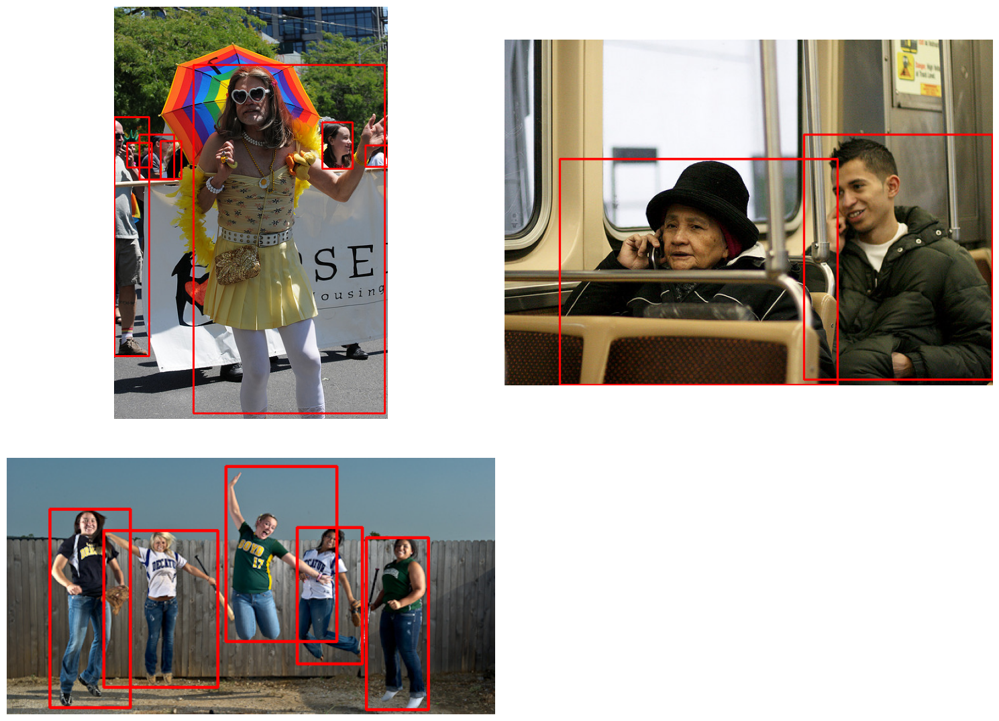

In [20]:
# Visualize a few training images
plot(
    image_paths='datasets/coco-2017/images/train',
    label_paths='datasets/coco-2017/labels/train',
    num_samples=3
)

# YAML File

Path untuk training diatur melalui file yaml

In [21]:
#Create the YAML file, adjusting according to the required class to be deteced, i.e. person
%%writefile coco_person.yaml
train: '/content/drive/MyDrive/Proj2B/datasets/coco-2017/images/train'
val: '/content/drive/MyDrive/Proj2B/datasets/coco-2017/images/val'

# class names
names:
  0: 'person'


Overwriting coco_person.yaml


# Training

In [22]:
train_model = 'yolov8l.yaml'
pretrained_weight = 'yolov8l.pt'

EPOCHS = 25

project = '/content/drive/My Drive/Proj2B/logs'
experiment = 'yolov8_25'

train_data = 'coco_person.yaml'

In [23]:
# Logging
os.makedirs(project, exist_ok=True)

In [24]:
# build from YAML and transfer weights
model = YOLO(train_model).load(pretrained_weight)

results = model.train(
    data=train_data,
    epochs=EPOCHS,
    imgsz=640,
    project=project,
    name=experiment,
)


                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  2                  -1  3    279808  ultralytics.nn.modules.block.C2f             [128, 128, 3, True]           
  3                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  4                  -1  6   2101248  ultralytics.nn.modules.block.C2f             [256, 256, 6, True]           
  5                  -1  1   1180672  ultralytics.nn.modules.conv.Conv             [256, 512, 3, 2]              
  6                  -1  6   8396800  ultralytics.nn.modules.block.C2f             [512, 512, 6, True]           
  7                  -1  1   2360320  ultralytics.nn.modules.conv.Conv             [512

100%|██████████| 83.7M/83.7M [00:00<00:00, 166MB/s]


Transferred 595/595 items from pretrained weights
Ultralytics YOLOv8.0.236 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8l.yaml, data=coco_person.yaml, epochs=25, time=None, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/My Drive/Proj2B/logs, name=yolov8_25, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=Fal

100%|██████████| 755k/755k [00:00<00:00, 150MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  2                  -1  3    279808  ultralytics.nn.modules.block.C2f             [128, 128, 3, True]           
  3                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  4                  -1  6   2101248  ultralytics.nn.modules.block.C2f             [256, 256, 6, True]           
  5                  -1  1   1180672  ultralytics.nn.modules.conv.Conv             [256, 512, 3, 2]              
  6                  -1  6   8396800  ultralytics.nn.modules.block.C2f             [512, 512, 6, True]           
  7                  -1  1   2360320  ultralytics

100%|██████████| 6.23M/6.23M [00:00<00:00, 150MB/s]


WARNING ⚠️ NMS time limit 0.550s exceeded
AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/Proj2B/datasets/coco-2017/labels/train... 3000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3000/3000 [00:16<00:00, 180.97it/s]


train: New cache created: /content/drive/MyDrive/Proj2B/datasets/coco-2017/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/MyDrive/Proj2B/datasets/coco-2017/labels/val... 500 images, 0 backgrounds, 0 corrupt: 100%|██████████| 500/500 [00:04<00:00, 116.31it/s]


val: New cache created: /content/drive/MyDrive/Proj2B/datasets/coco-2017/labels/val.cache
Plotting labels to /content/drive/My Drive/Proj2B/logs/yolov8_25/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 97 weight(decay=0.0), 104 weight(decay=0.0005), 103 bias(decay=0.0)
25 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/25        11G      1.426       1.55      1.495         78        640: 100%|██████████| 188/188 [02:41<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:13<00:00,  1.19it/s]


                   all        500       2090      0.098      0.209     0.0686     0.0238

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/25      11.4G      1.833      1.965      1.803         47        640: 100%|██████████| 188/188 [02:35<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:11<00:00,  1.45it/s]


                   all        500       2090      0.328      0.331      0.247      0.108

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/25      11.4G      1.769      1.876      1.729         73        640: 100%|██████████| 188/188 [02:33<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:10<00:00,  1.53it/s]

                   all        500       2090      0.351      0.352      0.282      0.124



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/25      11.4G        1.7      1.812      1.696         22        640: 100%|██████████| 188/188 [02:34<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:10<00:00,  1.53it/s]


                   all        500       2090      0.485      0.408      0.407      0.197

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/25      11.4G      1.629      1.694      1.639         68        640: 100%|██████████| 188/188 [02:34<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:11<00:00,  1.39it/s]

                   all        500       2090      0.533       0.45      0.457       0.24



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/25      11.4G      1.559      1.626      1.593         60        640: 100%|██████████| 188/188 [02:34<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:10<00:00,  1.60it/s]

                   all        500       2090      0.557      0.465      0.488      0.259



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/25      11.4G      1.513      1.542      1.562         84        640: 100%|██████████| 188/188 [02:34<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.67it/s]

                   all        500       2090      0.565      0.484      0.505       0.28



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/25      11.3G      1.475       1.49      1.531         61        640: 100%|██████████| 188/188 [02:33<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:11<00:00,  1.42it/s]

                   all        500       2090      0.625      0.498      0.552      0.306



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/25      11.3G      1.431      1.448       1.51         57        640: 100%|██████████| 188/188 [02:34<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:11<00:00,  1.45it/s]

                   all        500       2090      0.633      0.507      0.557      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/25      11.4G      1.401      1.394      1.483         63        640: 100%|██████████| 188/188 [02:33<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.66it/s]

                   all        500       2090      0.651      0.516      0.572       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/25      11.5G      1.387      1.379      1.475         48        640: 100%|██████████| 188/188 [02:34<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:10<00:00,  1.48it/s]

                   all        500       2090      0.657      0.548      0.606      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/25      11.3G      1.359      1.333      1.457         50        640: 100%|██████████| 188/188 [02:33<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.76it/s]

                   all        500       2090      0.662      0.548       0.61      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/25      11.5G      1.321      1.297       1.43         41        640: 100%|██████████| 188/188 [02:33<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:11<00:00,  1.41it/s]

                   all        500       2090      0.689      0.541      0.609      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/25      11.3G      1.287      1.244      1.407         63        640: 100%|██████████| 188/188 [02:34<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.81it/s]

                   all        500       2090      0.673      0.568      0.629      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/25      11.3G      1.261      1.213      1.393         41        640: 100%|██████████| 188/188 [02:34<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:10<00:00,  1.50it/s]

                   all        500       2090      0.666      0.562      0.626      0.389


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/25      11.3G      1.273      1.188        1.4         10        640: 100%|██████████| 188/188 [02:36<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.65it/s]

                   all        500       2090      0.671      0.567      0.626      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/25      11.3G      1.246      1.135       1.38         34        640: 100%|██████████| 188/188 [02:31<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:11<00:00,  1.41it/s]

                   all        500       2090      0.702       0.54      0.628      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/25      11.4G      1.211        1.1      1.356         26        640: 100%|██████████| 188/188 [02:32<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:10<00:00,  1.55it/s]

                   all        500       2090      0.702      0.587      0.655      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/25      11.4G      1.205      1.083      1.347         26        640: 100%|██████████| 188/188 [02:32<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.63it/s]

                   all        500       2090      0.693      0.583      0.652      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/25      11.3G       1.17      1.042      1.325         15        640: 100%|██████████| 188/188 [02:31<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:11<00:00,  1.41it/s]

                   all        500       2090      0.702      0.588      0.668      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/25      11.4G      1.139     0.9923      1.298         38        640: 100%|██████████| 188/188 [02:32<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:11<00:00,  1.39it/s]

                   all        500       2090      0.727        0.6      0.682      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/25      11.4G      1.112     0.9691      1.283         42        640: 100%|██████████| 188/188 [02:32<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:11<00:00,  1.37it/s]

                   all        500       2090      0.731      0.607       0.68      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/25      11.4G      1.091     0.9315      1.271         38        640: 100%|██████████| 188/188 [02:32<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:10<00:00,  1.58it/s]

                   all        500       2090      0.728      0.618      0.693       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/25      11.4G      1.071     0.8996      1.255         36        640: 100%|██████████| 188/188 [02:32<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.62it/s]

                   all        500       2090      0.755       0.61      0.697      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/25      11.4G      1.044     0.8687      1.235         23        640: 100%|██████████| 188/188 [02:32<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.62it/s]

                   all        500       2090      0.725       0.65       0.71      0.465



25 epochs completed in 1.220 hours.
Optimizer stripped from /content/drive/My Drive/Proj2B/logs/yolov8_25/weights/last.pt, 87.6MB
Optimizer stripped from /content/drive/My Drive/Proj2B/logs/yolov8_25/weights/best.pt, 87.6MB

Validating /content/drive/My Drive/Proj2B/logs/yolov8_25/weights/best.pt...
Ultralytics YOLOv8.0.236 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8l summary (fused): 268 layers, 43607379 parameters, 0 gradients, 164.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:16<00:00,  1.04s/it]


                   all        500       2090      0.726       0.65       0.71      0.465
Speed: 0.5ms preprocess, 12.4ms inference, 0.0ms loss, 3.9ms postprocess per image
Results saved to /content/drive/My Drive/Proj2B/logs/yolov8_25


In [25]:
%load_ext tensorboard
%tensorboard --logdir .

<IPython.core.display.Javascript object>

# Predict

Once trained and validated using the YAML file above, we can then now predict using some exemplary contents taken from the internet.

In [5]:
#predicting using an image with multiple persons
!yolo predict model='/content/drive/MyDrive/Proj2B/logs/yolov8_25/weights/best.pt' source='https://ultralytics.com/images/zidane.jpg'

Ultralytics YOLOv8.0.236 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8l summary (fused): 268 layers, 43607379 parameters, 0 gradients, 164.8 GFLOPs

100% 165k/165k [00:00<00:00, 18.3MB/s]
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/drive/MyDrive/Proj2B/zidane.jpg: 384x640 4 persons, 103.1ms
Speed: 10.5ms preprocess, 103.1ms inference, 819.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


In [6]:
#predicting using a video
!yolo predict model='/content/drive/MyDrive/Proj2B/logs/yolov8_25/weights/best.pt' source='https://i.pinimg.com/originals/17/b8/88/17b88830421465369c0e79532cf7b8cb.jpg'

Ultralytics YOLOv8.0.236 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8l summary (fused): 268 layers, 43607379 parameters, 0 gradients, 164.8 GFLOPs

100% 517k/517k [00:00<00:00, 17.3MB/s]
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/drive/MyDrive/Proj2B/17b88830421465369c0e79532cf7b8cb.jpg: 640x288 1 person, 83.6ms
Speed: 3.9ms preprocess, 83.6ms inference, 685.1ms postprocess per image at shape (1, 3, 640, 288)
Results saved to runs/detect/predict2
💡 Learn more at https://docs.ultralytics.com/modes/predict


In [7]:
#predicting using an image with a single person
!yolo predict model='/content/drive/MyDrive/Proj2B/logs/yolov8_25/weights/best.pt' source='/content/drive/MyDrive/Proj2/people.mp4'

Ultralytics YOLOv8.0.236 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8l summary (fused): 268 layers, 43607379 parameters, 0 gradients, 164.8 GFLOPs

video 1/1 (1/3493) /content/drive/MyDrive/Proj2/people.mp4: 384x640 13 persons, 124.6ms
video 1/1 (2/3493) /content/drive/MyDrive/Proj2/people.mp4: 384x640 13 persons, 39.5ms
video 1/1 (3/3493) /content/drive/MyDrive/Proj2/people.mp4: 384x640 13 persons, 39.4ms
video 1/1 (4/3493) /content/drive/MyDrive/Proj2/people.mp4: 384x640 11 persons, 39.4ms
video 1/1 (5/3493) /content/drive/MyDrive/Proj2/people.mp4: 384x640 12 persons, 39.4ms
video 1/1 (6/3493) /content/drive/MyDrive/Proj2/people.mp4: 384x640 11 persons, 39.4ms
video 1/1 (7/3493) /content/drive/MyDrive/Proj2/people.mp4: 384x640 9 persons, 35.5ms
video 1/1 (8/3493) /content/drive/MyDrive/Proj2/people.mp4: 384x640 8 persons, 22.3ms
video 1/1 (9/3493) /content/drive/MyDrive/Proj2/people.mp4: 384x640 11 persons, 22.2ms
video 1/1 (10/3493) /content/drive/MyDrive/Pr

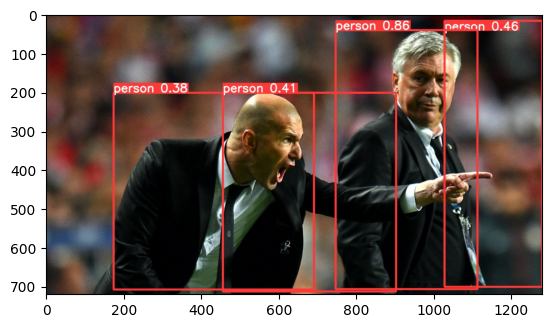

In [8]:
#The result of the prediction using an image with multiple persons
import os
import matplotlib.pyplot as plt
img1 = plt.imread('/content/drive/MyDrive/Proj2B/runs/detect/predict/zidane.jpg')
plt.imshow(img1)

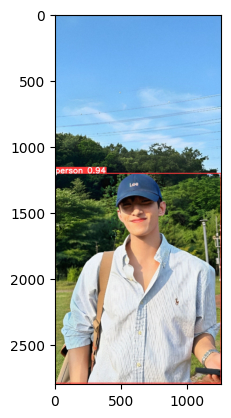

In [9]:
#the result of the prediction using an image with ma single person
img2 = plt.imread('/content/drive/MyDrive/Proj2B/runs/detect/predict2/17b88830421465369c0e79532cf7b8cb.jpg')
plt.imshow(img2)